# Hito 1

**Minería de Datos**

*CC5205-1 - Otoño 2022*

Integrantes:
- Felipe Urrutia
- Camilo Carvajal
- Gianluca Musso
- Jose Ignacio Saffie
- Matias Lopez Roman

## Introducción

### Preámbulo
Durante los últimos años hemos vivido un aumento considerable tanto en la cantidad y acceso a grandes cantidades de datos, como también a un poder de cálculo que ha proliferado las posibilidades para procesar estos.

En este contexto, el procesamiento de lenguaje natural ha adquirido un rol protagónico. A los métodos estadísticos y probabilísticos se le ha agregado modelos de lenguaje con impresionantes capacidades para procesar, clasificar en incluso generar texto. 

### Motivación del problema
Una de sus tareas más populares ha sido el análisis de sentimiento, que trata de predecir el valor emocional de algún documento. Esta es una tarea difícil incluso para seres humanos, pero muy útil puesto a que sus aplicaciones son variadas. Por ejemplo, es de interés para  una empresa saber el sentimiento de los clientes hacia sus productos. Esto se puede lograr procesando grandes cantidades de tweets o de reseñas. 

En su versión más explorada, el análisis de sentimiento trata de predecir cuan positivo o negativo es un mensaje, sin embargo este proceso puede ser refinado aún más. La complejidad del lenguaje humano nos sugiere que podemos considerar modelar el valor sentimental de un mensaje en un muchas más dimensiones.


### El dataset
El dataset **Multilingual Emoji Prediction** (Barbieri et al. 2010, descargable [con este link](https://github.com/fvancesco/Semeval2018-Task2-Emoji-Detection/blob/master/dataset/Semeval2018-Task2-EmojiPrediction.zip?raw=true)) contiene alrededor de 500k tweets, todos conteniendo un emoji, de un conjunto de 20 comúnmente usados. El desafío de base es predecir el emoji en cuestión desde el texto del tweet. Esta tarea puede ser interpretada como una de análisis de sentimiento multimodal puesto a que el emoji comúnmente denota información no verbal del mensaje o contexto, muchas veces emocional.

Barbieri, F., Camacho-Collados, J., Ronzano, F., Espinosa Anke, L., Ballesteros, M., Basile, V., ... & Saggion, H. (2018). Semeval 2018 task 2: Multilingual emoji prediction. In 12th International Workshop on Semantic Evaluation (SemEval 2018) (pp. 24-33). Association for Computational Linguistics. [http://dx.doi.org/10.18653/v1/S18-1003](http://dx.doi.org/10.18653/v1/S18-1003)

**Librerias**

In [1]:
import pandas as pd
import numpy as np
import pickle
from string import punctuation
 
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="whitegrid")
plt.rc('axes', titlesize=14)
plt.rc('legend', fontsize=14)
plt.rc('xtick', labelsize=12)
plt.rc('ytick', labelsize=12)
plt.rcParams.update({'font.size': 16})
plt.rcParams['axes.titlesize'] = 16
plt.rcParams["figure.figsize"] = (10, 6)
plt.rcParams.update({'lines.markeredgewidth': 1})
plt.rcParams.update({'errorbar.capsize': 2})
import plotly.express as px

**Rutas**

```
Data
|-mapping
|--df_es_mapping.pickle
|--df_us_mapping.pickle
|--es_mapping.txt
|--us_mapping.txt
|-test
|--df_es_test.pickle
|--df_us_test.pickle
|--es_test.labels
|--es_test.text
|--us_test.labels
|--us_test.text
|-trial
|--df_es_trial.pickle
|--df_us_trial.pickle
|--es_trial.labels
|--es_trial.text
|--us_trial.labels
|--us_trial.text
|--[train]
|--df_es_train.pickle
|--df_us_train.pickle
```

In [2]:
file_names = {
    "df_es_mapping": "../../Data/mapping/df_es_mapping.pickle",
    "df_us_mapping": "../../Data/mapping/df_us_mapping.pickle",
    
    "df_es_test": "../../Data/test/df_es_test.pickle",
    "df_us_test": "../../Data/test/df_us_test.pickle",
    
    "df_es_train": "../../Data/train/df_es_train.pickle",
    "df_us_train": "../../Data/train/df_us_train.pickle",
    
    "df_es_trial": "../../Data/trial/df_es_trial.pickle",
    "df_us_trial": "../../Data/trial/df_us_trial.pickle",
}

**Cargar sets**

In [3]:
df_es_train = pickle.load(open(file_names["df_es_train"], "rb"))
df_es_trial = pickle.load(open(file_names["df_es_trial"], "rb"))
df_es_test = pickle.load(open(file_names["df_es_test"], "rb"))

df_us_train = pickle.load(open(file_names["df_us_train"], "rb"))
df_us_trial = pickle.load(open(file_names["df_us_trial"], "rb"))
df_us_test = pickle.load(open(file_names["df_us_test"], "rb"))

## Exploración de datos

Procedemos a explorar el dataset. A diferencia de otros datasets donde abundan los atributos numéricos, nuestros datos consisten de texto catalogado con un emoji. En esta sección procederemos como sigue: primero estudiaremos los emoji, luego procesaremos y analizaremos el texto, para finalmente hacer una primera exploración de ambas variables en conjunto.

Primeramente observemos los emojis del dataset. Estos son un conjunto pre-definido, 20 emojis para inglés y 19 para español. Visualicemos el emoji y veamos a que label corresponden.

**Español**

In [4]:
df_es_mapping = pickle.load(open(file_names["df_es_mapping"], "rb"))
df_es_mapping

,label,emoji,name
0,0,❤,_red_heart_
1,1,😍,_smiling_face_with_hearteyes_
2,2,😂,_face_with_tears_of_joy_
3,3,💕,_two_hearts_
4,4,😊,_smiling_face_with_smiling_eyes_
5,5,😘,_face_blowing_a_kiss_
6,6,💪,_flexed_biceps_
7,7,😉,_winking_face_
8,8,👌,_OK_hand_
9,9,🇪🇸,_Spain_


**Inglés**

In [5]:
df_us_mapping = pickle.load(open(file_names["df_us_mapping"], "rb"))
df_us_mapping

,label,emoji,name
0,0,❤,_red_heart_
1,1,😍,_smiling_face_with_hearteyes_
2,2,😂,_face_with_tears_of_joy_
3,3,💕,_two_hearts_
4,4,🔥,_fire_
5,5,😊,_smiling_face_with_smiling_eyes_
6,6,😎,_smiling_face_with_sunglasses_
7,7,✨,_sparkles_
8,8,💙,_blue_heart_
9,9,😘,_face_blowing_a_kiss_


### Frecuencia de emojis

Queremos saber cuan balanceados están los dataset en dos sentidos:
- Si hay emojis con mucha mayor frecuencia que otros
- Si hay la misma distribución de emojis en los conjuntos de entrenamiento, testeo y ensayo.

Cargamos el train set en español.

In [6]:
frecuencias1 = df_es_train.merge(df_es_mapping, how="right", on="label")["emoji"].value_counts().to_frame()
frecuencias1 = frecuencias1.reset_index().rename(columns={"emoji": "freq.", "index": "emoji"})
frecuencias2 = frecuencias1.merge(df_es_mapping,how='right', on='emoji')
frecuencias2

,emoji,freq.,label,name
0,❤,16102,0,_red_heart_
1,😍,11429,1,_smiling_face_with_hearteyes_
2,😂,7725,2,_face_with_tears_of_joy_
3,💕,5348,3,_two_hearts_
4,😊,5448,4,_smiling_face_with_smiling_eyes_
5,😘,3660,5,_face_blowing_a_kiss_
6,💪,3124,6,_flexed_biceps_
7,😉,3117,7,_winking_face_
8,👌,2884,8,_OK_hand_
9,🇪🇸,2757,9,_Spain_


In [7]:
fig_es = px.histogram(frecuencias2, x="emoji", y = "freq.")
fig_es.update_layout(
    title="Frecuencia de Emojis",
    yaxis_title="Frecuencia")
fig_es.show()

El emoji ❤ es más frecuente que el resto. Se observa una distribución poco homogénea.

Esto se puede visualizar en un box plot.

<AxesSubplot:>

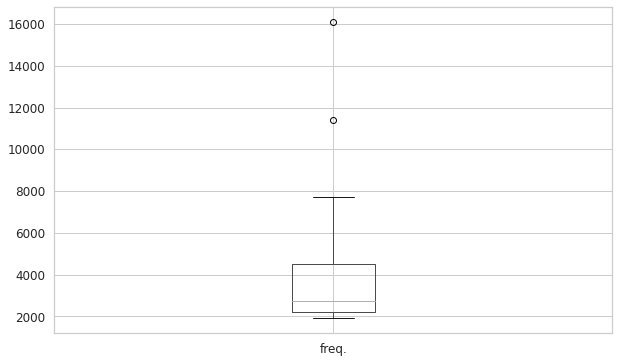

In [8]:
frecuencias2.boxplot(column = "freq.")

A continuación analizaremos las medidas de tendencia central asociadas a la ocurrencia de los emoji. Esto nos permitirá tener una freuencia normalizada, i.e., a cuantas desviaciones estándar se aleja el valor del promedio, para los tres conjuntos.

In [9]:
def contar(df):
    # retorna diccionario id_eomji : frecuencia
    return df['emoji'].value_counts().to_dict()

# contar(df_es_train.merge(df_es_mapping, how="right", on="label"))  # ejemplo de uso

def tendencia_freq_emojis(df,verbose=True):
    conteo = contar(df)
    mean = np.mean(list(conteo.values()))
    std = np.std(list(conteo.values()))
    conteo_norm = {k:(v-mean)/std for k, v in conteo.items()}
    if verbose:
        print("media: {}".format(mean))
        print("desviación estándar: {}".format(std))
    return mean, std, conteo_norm

mean, std, conteo_norm = tendencia_freq_emojis(df_es_train.merge(df_es_mapping, how="right", on="label"))

conteo_norm

media: 4280.315789473684
desviación estándar: 3643.0362994656502


{'❤': 3.2450086243335776,
 '😍': 1.962287395153011,
 '😂': 0.9455530846704909,
 '😊': 0.32052500017570185,
 '💕': 0.29307536976310683,
 '😘': -0.17027439160149743,
 '💪': -0.31740441061300684,
 '😉': -0.3193258847418885,
 '👌': -0.3832835236032349,
 '🇪🇸': -0.4181445542272306,
 '😎': -0.45849551093374535,
 '💙': -0.5279430758776108,
 '😜': -0.5466088245581754,
 '💜': -0.5680195362799996,
 '😁': -0.5702155067130071,
 '🎶': -0.5951946703884686,
 '💞': -0.6146839079814111,
 '✨': -0.6242912786258193,
 '💘': -0.6525643979507922}

In [10]:
# todos los sets
mean_es_test, std_es_test, conteo_norm_es_test = tendencia_freq_emojis(df_es_test.merge(df_es_mapping, how="right", on="label"),verbose=False)
mean_es_trial, std_es_trial, conteo_norm_es_trial = tendencia_freq_emojis(df_es_trial.merge(df_es_mapping, how="right", on="label"),verbose=False)

Las medias y desviación estándar para los tres conjuntos son los siguientes

In [11]:
print('Dataset en Español')
print("%25s" % "Train", "%15s" % "Test", "%15s" % "Trial")
print('=================================================================================')
print('Media '+"%18s" %"%.1f" % mean, "%13s" % "%.1f" % mean_es_test, "%15s" % "%.1f" % mean_es_trial)
print('Desviación std. '+"%8s" %"%.1f" % std, "%13s" % "%.1f" % std_es_test, "%15s" % "%.1f" % std_es_trial)

Dataset en Español
                    Train            Test           Trial
Media               4280.3          526.3            526.3
Desviación std.     3643.0          528.7            454.0


En seguida procedemos a mostrar la frecuencia normalizada para cada emoji, calculada con la función 'tendencia_freq_emojis'

In [12]:
# mostrar dataframe emojis vs frecuencia y frecuencia normalizada
estudio_freq = frecuencias2.copy()
estudio_freq = estudio_freq.set_index('label')
estudio_freq = estudio_freq.rename(columns={'freq.':'freq. train'})
estudio_freq['freq. norm. train'] = conteo_norm.values()
estudio_freq['freq. test'] = contar(df_es_test.merge(df_es_mapping, how="right", on="label")).values()
estudio_freq['freq. norm. test'] = conteo_norm_es_test.values()
estudio_freq['freq. trial'] = contar(df_es_trial.merge(df_es_mapping, how="right", on="label")).values()
estudio_freq['freq. norm. trial'] = conteo_norm_es_trial.values()
estudio_freq

,emoji,freq. train,name,freq. norm. train,freq. test,freq. norm. test,freq. trial,freq. norm. trial
label,,,,,,,,
0,❤,16102,_red_heart_,3.245009,2141,3.053876,2028,3.307641
1,😍,11429,_smiling_face_with_hearteyes_,1.962287,1499,1.839652,1363,1.842898
2,😂,7725,_face_with_tears_of_joy_,0.945553,1408,1.667542,970,0.977268
3,💕,5348,_two_hearts_,0.320525,514,-0.023293,705,0.393574
4,😊,5448,_smiling_face_with_smiling_eyes_,0.293075,453,-0.138663,645,0.261416
5,😘,3660,_face_blowing_a_kiss_,-0.170274,424,-0.193511,415,-0.245186
6,💪,3124,_flexed_biceps_,-0.317404,416,-0.208642,386,-0.309062
7,😉,3117,_winking_face_,-0.319326,413,-0.214316,369,-0.346507
8,👌,2884,_OK_hand_,-0.383284,397,-0.244577,367,-0.350912


Visualizaremos lo anterior usando la libería Plotly. Primero veamos las frecuencias sin normalizar.

Es dificil a simple vista responder a nuestra segunda pregunta: ¿son similares las distribuciones en los distintos datasets?

In [13]:
fig_es = px.histogram(estudio_freq, x="emoji", y =['freq. train','freq. test','freq. trial'])
fig_es.update_layout(
    title="Frecuencia de Emojis - Idioma Español",
    yaxis_title="Frecuencia")
fig_es.show()

Sin embargo, con la frecuencia normalizada es fácil ver que en general eso es efectivamente el caso.

In [14]:
# barmode="group"
fig_es = px.histogram(estudio_freq, x="emoji", y =['freq. norm. train','freq. norm. test','freq. norm. trial'], barmode="group")
fig_es.update_layout(
    title="Frecuencia Normalizada de Emojis - Idioma Español",
    yaxis_title="Frecuencia Normalizada")
fig_es.show()

Sólo algunos emojis como 😂 poseen valores considerablemente distintos, en general las distribuciones no difieren de manera sustancial.

Ahora realizaremos el mismo estudio para el dataset en inglés

In [15]:
mean_en_train, std_en_train, conteo_norm_en_train = tendencia_freq_emojis(df_us_train.merge(df_us_mapping, how="right", on="label"),verbose=False)
mean_en_trial, std_en_trial, conteo_norm_en_trial = tendencia_freq_emojis(df_us_trial.merge(df_us_mapping, how="right", on="label"),verbose=False)
mean_en_test, std_en_test, conteo_norm_en_test = tendencia_freq_emojis(df_us_test.merge(df_us_mapping, how="right", on="label"),verbose=False)

In [16]:
print('Dataset en Inglés')
print("%25s" % "Train", "%15s" % "Test", "%15s" % "Trial")
print('=================================================================================')
print('Media '+"%18s" %"%.1f" % mean_en_train, "%13s" % "%.1f" % mean_en_test, "%15s" % "%.1f" % mean_en_trial)
print('Desviación std. '+"%8s" %"%.1f" % std_en_train, "%13s" % "%.1f" % std_en_test, "%15s" % "%.1f" % std_en_trial)

Dataset en Inglés
                    Train            Test           Trial
Media               19364.6          2500.0            2500.0
Desviación std.     17194.3          2196.8            2219.7


In [17]:
frecuencias_en = df_us_train.merge(df_us_mapping, how="right", on="label")["emoji"].value_counts().to_frame()
frecuencias_en = frecuencias_en.reset_index().rename(columns={"emoji": "freq.", "index": "emoji"})
frecuencias_en = frecuencias_en.merge(df_us_mapping,how='right', on='emoji')

frecuencias_en = frecuencias_en.rename(columns={'freq.':'freq. train'})
frecuencias_en['freq. norm. train'] = conteo_norm_en_train.values()
frecuencias_en['freq. test'] = contar(df_us_test.merge(df_us_mapping, how="right", on="label")).values()
frecuencias_en['freq. norm. test'] = conteo_norm_en_test.values()
frecuencias_en['freq. trial'] = contar(df_us_trial.merge(df_us_mapping, how="right", on="label")).values()
frecuencias_en['freq. norm. trial'] = conteo_norm_en_trial.values()
frecuencias_en

,emoji,freq. train,label,name,freq. norm. train,freq. test,freq. norm. test,freq. trial,freq. norm. trial
0,❤,83611,0,_red_heart_,3.736497,10798,3.777238,10760,3.721304
1,😍,40934,1,_smiling_face_with_hearteyes_,1.254451,4830,1.060613,5279,1.251998
2,😂,40396,2,_face_with_tears_of_joy_,1.223162,4534,0.925874,5241,1.234878
3,💕,19991,3,_two_hearts_,0.039397,3716,0.553522,2885,0.173451
4,🔥,20042,4,_fire_,0.036431,2749,0.113344,2517,0.007659
5,😊,18493,5,_smiling_face_with_smiling_eyes_,-0.050691,2605,0.047796,2317,-0.082445
6,😎,17127,6,_smiling_face_with_sunglasses_,-0.130136,2417,-0.037781,2049,-0.203185
7,✨,13890,7,_sparkles_,-0.318396,1996,-0.229420,1894,-0.273016
8,💙,12662,8,_blue_heart_,-0.368122,1949,-0.250814,1796,-0.317167
9,😘,12671,9,_face_blowing_a_kiss_,-0.389292,1613,-0.403761,1671,-0.373482


In [18]:
fig_es = px.histogram(frecuencias_en, x="emoji", y =['freq. train','freq. test','freq. trial'])
fig_es.update_layout(
    title="Frecuencia de Emojis - Idioma Inglés",
    yaxis_title="Frecuencia")
fig_es.show()

In [19]:
fig_es = px.histogram(frecuencias_en, x="emoji", y =['freq. norm. train','freq. norm. test','freq. norm. trial'], barmode="group")
fig_es.update_layout(
    title="Frecuencia Normalizada de Emojis - Idioma Inglés",
    yaxis_title="Frecuencia Normalizada")
fig_es.show()

Las observaciones que hicimos para español aplican igualmente para inglés. El dataset está desbalanceado en cuanto a emojis dominantes, lo cual puede ser problemático para un clasificador. Por otr lado, las proporciones entre distintos conjuntos son suficientemente parecidas.

### Largo de tweets

En seguida procedemos a estudiar el largo de los tweets. Queremos ver como varía el largo del mensaje al aplicar pre-procesamiento y como varía entre distintos emoji. En lo que sigue nos restringimos al dataset en idioma inglés.

In [20]:
df_us_train

,id,text,label
0,729044324441186304,Selfies for summatime @ Drexel University,12
1,663834134037442560,Ready to be a bulldog with rasso #hailstate #i...,14
2,747449193350963200,#scored my new #matcotools #slidehammer weight...,16
3,691439672761925637,@user last night was so much fun @ Skyway Thea...,6
4,758118895618109440,love beach days @ Manasquan Beach,12
...,...,...,...
387287,748286488077537280,I love you #Seattle #spaceneedle #nictayseatac...,0
387288,769190703540862976,"Here's to a new chapter, new experiences, and ...",0
387289,657763832111218688,Off the cali edibles,2
387290,812545557864464384,#FamtasyFridsysATL medusaloungeatl we just got...,4


Usaremos la libería NLTK (Natural Language TookKit) para "tokenizar" el texto (convertir palabras a miembros únicos de un vocabulario).

In [21]:
import nltk
from nltk.corpus import stopwords
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.stem.porter import PorterStemmer
from nltk.tokenize import TweetTokenizer # tokenizer especial para tweets
tt = TweetTokenizer()

Pasar a minúsculas y tokenizar

In [22]:
%%time
df_us_train['tokenized_text'] = df_us_train['text'].str.lower().apply(tt.tokenize) 
df_us_train.head()

CPU times: user 23.6 s, sys: 165 ms, total: 23.8 s
Wall time: 23.8 s


,id,text,label,tokenized_text
0,729044324441186304,Selfies for summatime @ Drexel University,12,"[selfies, for, summatime, @, drexel, university]"
1,663834134037442560,Ready to be a bulldog with rasso #hailstate #i...,14,"[ready, to, be, a, bulldog, with, rasso, #hail..."
2,747449193350963200,#scored my new #matcotools #slidehammer weight...,16,"[#scored, my, new, #matcotools, #slidehammer, ..."
3,691439672761925637,@user last night was so much fun @ Skyway Thea...,6,"[@user, last, night, was, so, much, fun, @, sk..."
4,758118895618109440,love beach days @ Manasquan Beach,12,"[love, beach, days, @, manasquan, beach]"


Veamos como distribuye el largo antes de pre-procesar.

In [45]:
df_us_train["length pre-processed"] = df_us_train['tokenized_text'].apply(len)
import plotly.express as px
fig = px.histogram(df_us_train, x="length pre-processed")
fig.update_layout(
    title="Histograma de la cantidad de palabras por tweet",
    yaxis_title="Frecuencia")
fig.show()

Podemos refinar más aún nuestro procesamiento. Procedemos a remover las puntuaciones y palabras que no aportan valor semántico (stop words).

In [24]:
nltk.download('stopwords')
from nltk.corpus import stopwords

stopwords_en = stopwords.words('english')
print(stopwords_en[:10])

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're"]


[nltk_data] Downloading package stopwords to /home/camilo/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [25]:
from string import punctuation
stopwords_en_withpunct = set(stopwords_en).union(set(punctuation))
print(list(stopwords_en_withpunct)[:10])

['your', 'because', 'so', '.', '`', 'nor', 'herself', 'himself', 'we', 'yours']


In [26]:
df_us_train['tokenized_text'] = df_us_train['tokenized_text'].apply(lambda x: [word for word in x if word not in (stopwords_en_withpunct)])
df_us_train["length tokenized"] = df_us_train['tokenized_text'].apply(len)
df_us_train.head()

,id,text,label,tokenized_text,length pre-processed,length tokenized
0,729044324441186304,Selfies for summatime @ Drexel University,12,"[selfies, summatime, drexel, university]",6,4
1,663834134037442560,Ready to be a bulldog with rasso #hailstate #i...,14,"[ready, bulldog, rasso, #hailstate, #ily, #roo...",16,11
2,747449193350963200,#scored my new #matcotools #slidehammer weight...,16,"[#scored, new, #matcotools, #slidehammer, weig...",16,9
3,691439672761925637,@user last night was so much fun @ Skyway Thea...,6,"[@user, last, night, much, fun, skyway, theatre]",10,7
4,758118895618109440,love beach days @ Manasquan Beach,12,"[love, beach, days, manasquan, beach]",6,5


El largo ahora ha cambiado, nos quedamos con un mensaje más conciso. Veamos como cambió la distribución:

In [46]:
fig = px.histogram(df_us_train, x="length tokenized")
fig.update_layout(
    title="Histograma de la cantidad de palabras por tweet Tokenizados",
    yaxis_title="Frecuencia")
fig.show()

Finalmente, podemos ir más allá y realizar un "stemming", que consiste en dejar la raiz linguística de cada palabra. De este modo, palabras que son conjugaciones una de otra o un cambio singular-plural, serán mapeadas al mismo token único.

In [28]:
from nltk.stem import PorterStemmer

# puede ser porter o wnl
porter = PorterStemmer()
wnl = WordNetLemmatizer()

In [29]:
%%time
df_us_train['StemmedTokenized_text'] = df_us_train['tokenized_text'].apply(lambda x: [porter.stem(word) for word in x])

CPU times: user 42.9 s, sys: 107 ms, total: 43 s
Wall time: 43 s


In [30]:
df_us_train.head()

,id,text,label,tokenized_text,length pre-processed,length tokenized,StemmedTokenized_text
0,729044324441186304,Selfies for summatime @ Drexel University,12,"[selfies, summatime, drexel, university]",6,4,"[selfi, summatim, drexel, univers]"
1,663834134037442560,Ready to be a bulldog with rasso #hailstate #i...,14,"[ready, bulldog, rasso, #hailstate, #ily, #roo...",16,11,"[readi, bulldog, rasso, #hailstat, #ili, #room..."
2,747449193350963200,#scored my new #matcotools #slidehammer weight...,16,"[#scored, new, #matcotools, #slidehammer, weig...",16,9,"[#score, new, #matcotool, #slidehamm, weight, ..."
3,691439672761925637,@user last night was so much fun @ Skyway Thea...,6,"[@user, last, night, much, fun, skyway, theatre]",10,7,"[@user, last, night, much, fun, skyway, theatr]"
4,758118895618109440,love beach days @ Manasquan Beach,12,"[love, beach, days, manasquan, beach]",6,5,"[love, beach, day, manasquan, beach]"


Finalmente, queremos confirmar que las distribuciones de largo no diferen significativamente entre distintos conjuntos (entrenamiento, trial, test)

In [31]:
def procesar_df(df):
    df_copy = df.copy()
    df_copy['tokenized_text'] = df_copy['text'].str.lower().apply(tt.tokenize)
    df_copy["length pre-processed"] = df_copy['tokenized_text'].apply(len)
    df_copy['tokenized_text'] = df_copy['tokenized_text'].apply(lambda x: [word for word in x if word not in (stopwords_en_withpunct)])
    df_copy["length tokenized"] = df_copy['tokenized_text'].apply(len)
    df_copy['StemmedTokenized_text'] = df_copy['tokenized_text'].apply(lambda x: [porter.stem(word) for word in x])
    return df_copy

In [32]:
%%time
df_us_test = procesar_df(df_us_test)

CPU times: user 8.89 s, sys: 35.8 ms, total: 8.93 s
Wall time: 8.93 s


In [33]:
%%time
df_us_trial = procesar_df(df_us_trial)

CPU times: user 9.03 s, sys: 27.9 ms, total: 9.06 s
Wall time: 9.05 s


In [34]:
def tendencia_central_largo(df):
    # toma un df con datos largos pre-calculados
    mean_pre = np.mean(df['length pre-processed'].values)
    std_pre = np.std(df['length pre-processed'].values)
    mean_post = np.mean(df['length tokenized'].values)
    std_post = np.std(df['length tokenized'].values)
    return mean_pre, std_pre, mean_post, std_post

mean_pre, std_pre, mean_post, std_post = tendencia_central_largo(df_us_train)
mean_pre_test, std_pre_test, mean_post_test, std_post_test = tendencia_central_largo(df_us_test)
mean_pre_trial, std_pre_trial, mean_post_trial, std_post_trial = tendencia_central_largo(df_us_trial)

In [35]:
print('Dataset en Inglés - largo de tweet')
print("%25s" % "Train", "%15s" % "Test", "%15s" % "Trial")
print('=================================================================================')
print("Pre-procesamiento")
print('Media '+"%18s" %"%.1f" % mean_pre, "%12s" % "%.1f" % mean_pre_test, "%13s" % "%.1f" % mean_pre_trial)
print('Desviación std. '+"%8s" %"%.1f" % std_pre, "%13s" % "%.1f" % std_pre_test, "%15s" % "%.1f" % std_pre_trial)
print('=================================================================================')
print("Post-procesamiento")
print('Media '+"%18s" %"%.1f" % mean_post, "%13s" % "%.1f" % mean_post_test, "%15s" % "%.1f" % mean_post_trial)
print('Desviación std. '+"%8s" %"%.1f" % std_post, "%13s" % "%.1f" % std_post_test, "%15s" % "%.1f" % std_post_trial)

Dataset en Inglés - largo de tweet
                    Train            Test           Trial
Pre-procesamiento
Media               13.1         14.0          12.9
Desviación std.     4.9          4.9            4.9
Post-procesamiento
Media               7.9          8.6            7.8
Desviación std.     2.7          2.7            2.7


Finalmente analizaremos el largo de los tweets segun su emoji. Puede suceder que para algún mensaje que denote cierto sentimiento, existan correlaciones con el largo del tweet. Veamos si es el caso.

In [36]:
df_us_test.head()

,id,text,label,tokenized_text,length pre-processed,length tokenized,StemmedTokenized_text
0,test0,en Pelham Parkway,2,"[en, pelham, parkway]",3,3,"[en, pelham, parkway]"
1,test1,The calm before...... | w/ sofarsounds @user |...,10,"[calm, ..., w, sofarsounds, @user, b, hall, .....",17,10,"[calm, ..., w, sofarsound, @user, b, hall, ......"
2,test2,Just witnessed the great solar eclipse @ Tampa...,6,"[witnessed, great, solar, eclipse, tampa, flor...",10,6,"[wit, great, solar, eclips, tampa, florida]"
3,test3,This little lady is 26 weeks pregnant today! E...,1,"[little, lady, 26, weeks, pregnant, today, exc...",20,12,"[littl, ladi, 26, week, pregnant, today, excit..."
4,test4,"Great road trip views! @ Shartlesville, Pennsy...",16,"[great, road, trip, views, shartlesville, penn...",9,6,"[great, road, trip, view, shartlesvil, pennsyl..."


In [44]:
fig = px.box(pd.merge(df_us_mapping,df_us_test,how='right', on='label'), x="emoji", y=["length pre-processed"])
fig.update_layout(
    title="Boxplots para Largo de Tweet por Emoji",
    yaxis_title="largo de tweet")
fig.show()

Se observa una homogeneidad cuando filtramos con respecto a los emojis. Los boxplots son similares para cada etiqueta, por ende no se observa que las diferencias semánticas que conllevan un emoji distinto se traduzcan en mensajes más cortos o largos.

## Analisis de tokens mas frecuentes para ingles

En este último análisis nos gustaría observar que palabras están más propensas a co-existir con ciertos emojis. Procederemos a visualizar esto.

In [38]:
vocab_us_train = {label: {} for label in set(df_us_mapping["label"])}
for label in vocab_us_train.keys():
    for ix in df_us_train[df_us_train["label"] == label].index:
        tokens = list(df_us_train.loc[ix]["StemmedTokenized_text"])
        for t in tokens:
            if t not in vocab_us_train[label].keys():
                vocab_us_train[label][t] = 0
            vocab_us_train[label][t] += 1

In [39]:
most_freq_tokens_us_train = {label: [] for label in set(df_us_mapping["label"])}
for label in most_freq_tokens_us_train.keys():
    most_freq_tokens_us_train[label] = sorted(vocab_us_train[label].items(), key=lambda x: x[1], reverse=True)[:10]

Veamos un subconjunto del diccionario

In [47]:
{i:most_freq_tokens_us_train[i] for i in ['1','13']}

{'1': [('…', 15832),
  ('@user', 8934),
  ('love', 4635),
  ('new', 2738),
  ('...', 2196),
  ('beauti', 1965),
  ('day', 1691),
  ('night', 1319),
  ('look', 1306),
  ('thank', 1273)],
 '13': [('…', 3578),
  ('@user', 1915),
  ('love', 1473),
  ('happi', 654),
  ('thank', 593),
  ('day', 529),
  ('new', 473),
  ('univers', 417),
  ('...', 416),
  ('best', 411)]}

In [41]:
from wordcloud import WordCloud, STOPWORDS

In [42]:
%%time
text_by_label_us_train = {label: [] for label in set(df_us_mapping["label"])}
for label in text_by_label_us_train.keys():
    text = " ".join(" ".join(list(df_us_train.loc[ix]["StemmedTokenized_text"])) for ix in df_us_train[df_us_train["label"] == label].index)
    text_by_label_us_train[label] = text

CPU times: user 40.5 s, sys: 47.8 ms, total: 40.5 s
Wall time: 40.5 s


In [43]:
%%time
wordcloud_by_label_us_train = {label: [] for label in set(df_us_mapping["label"])}
for label in wordcloud_by_label_us_train.keys():
    text = text_by_label_us_train[label]
    wordcloud = WordCloud(stopwords=stopwords, width=800, height=800, background_color="white").generate(text)
    wordcloud_by_label_us_train[label] = wordcloud

TypeError: 'WordListCorpusReader' object is not iterable

In [ ]:
import textwrap

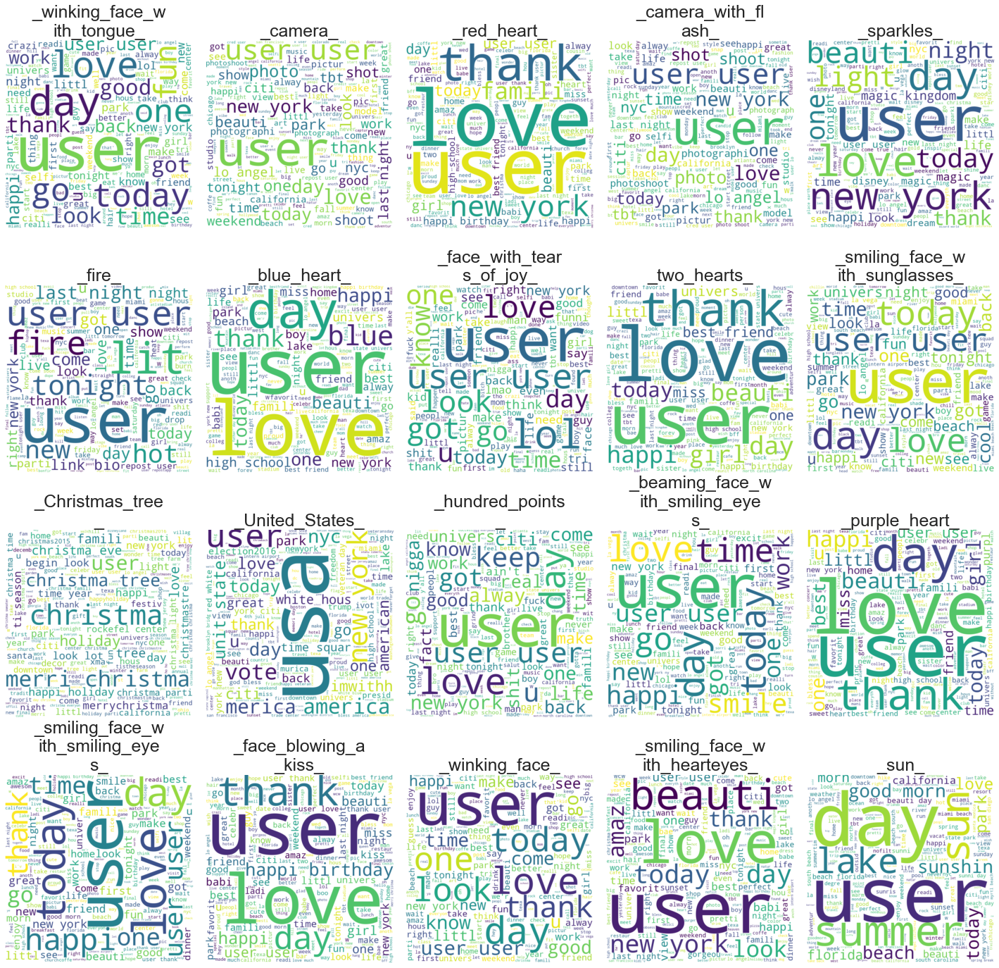

In [ ]:
fig, ax = plt.subplots(4, 5, figsize=(4*5, 5*5))
stopwords = set(STOPWORDS)

for k, label in enumerate(set(df_us_mapping["label"])):
    axk = ax[k//5, k%5]

    wordcloud = wordcloud_by_label_us_train[label]
    
    axk.imshow(wordcloud, interpolation='bilinear')
    axk.axis("off")
    emoji = df_us_mapping[df_us_mapping["label"] == label].iloc[0]["name"]
    axk.set_title("\n".join(textwrap.wrap(emoji, 15)), size=25)
    
fig.subplots_adjust(hspace=-0.65)
fig.tight_layout() 

Se observan dos efectos importantes.
- Algunas palabras suceden mucho para todos los emoji, como es el caso del token 'user'. Esto nos sugiere que tales palabras no serán útiles para discriminar mensajes según su emoji.
- Por otro lado, ciertas palabras abundan en cierto tipo de emoji, como es el caso de 'love' para emojis con forma de corazón. Esto puede ser positivo para que un clasificador razone acerca del tipo de mensaje. Más aún, ciertos emojis presentan una concentración muy fuerte de ciertas palabras clave, como es el caso de 'christmas' para 🎄, y 'usa' para 🇺🇸.

## Preguntas

Dado el análisis realizado anteriormente, hemos desarrollado una lista de seis preguntas que queremos responder a lo largo de este proyecto.

### Pregunta 1
**Para cada idioma, ¿somos capaces de ajustar un modelo predictivo que reciba un tweet y prediga su emoji asociado?**

Las herramientas de procesamiento de texto natural han mostrado capacidades muy parecidas a las humanas. Testear sus capacidades en el contexto de este dataset es interesante puesto a que la variable a predecir es inherentemente subjetiva. En general, se espera que el emoji esté asociado al carácter emocional del tweet en cuestión, por ende tiene sentido testear modelos que han sido entrenados o ajustados para detectar sentimientos. No obstante, en este desafío hay emojis que presentan similar valor emocional. Además puede ser que el emoji corresponda a variables de mayor complejidad, como el sarcasmo del mensaje. Es por esto que el éxito en la predicción sería tarea difícil incluso para un humano.

Para responder a esta pregunta podemos usar modelos como Naïve Bayes, en el cual tomamos en consideración la ocurrencia de cada palabra en tweets de cada emoji, información que luego se usa para generar una probabilidad de emoji dado el tweet. También podría ser interesante usar modelos que tomen en consideración la interacción entre palabras. Un ejemplo de esto son los modelos de lenguaje. Podemos usar modelos de lenguajes pre-entrenados basados en redes neuronales, como es el caso de BERT/BETO, y ajustarlos para la predicción de emojis.

### Pregunta 2
**¿Podemos utilizar representaciones vectoriales apropiadas de los tweets y encontrar modelos descriptivos de agrupamiento de datos como clustering capaces de relacionar más aquellos tweets asociados a un mismo emoji?**
	
El paradigma tradicional de representación vectorial de datos es a través de un diseño manual de atributos. En Procesamiento del Lenguaje Natural existen varias aproximaciones para representar vectorialmente el texto. Métodos como Bag-of-word y tf-idf son formas rudimentarias de codificar la información del texto, mientras que el uso de word-embeddings como word2vec y el modelo del lenguaje como BERT son formas más sofisticadas de hacer lo mismo aprovechándose de propiedades más complejas del texto. En nuestro caso, nos interesa explorar distintas aproximaciones que puedan vectorizar apropiadamente un tweet. Por otro lado, cada uno de los tweets de la base de datos posee un único emoji asociado. El emoji es una de las tantas características comunes que relacionan a los tweets. Hay características desde simples hasta complejas de detectar. Una característica simple que nos permite agrupar los tweet es la cantidad de palabras que poseen. Con esto, podemos tener dos grupos: aquellos con (1) varias palabras y (2) pocas palabras. Características complejas suelen ser más difíciles de detectar, como lo es el sentimiento de un tweet. Así, podemos tener dos grupos: aquellos con sentimiento (1) positivo, (2) neutro y (3) negativo. Ahora bien, estamos interesados en explorar distintos algoritmos de clustering con el objetivo de encontrar aquellos que sean capaces de traducir grupos diferenciados según el único emoji presente en el tweet tanto para inglés como para español. Entre los algoritmos a explorar estan: k-means, aglomerativo, gaussian mixtures, dbscan y optics.

### Pregunta 3
**¿Podemos relacionar a cada palabra una probabilidad/proporción de pertenecer a un cierto emoji?**

Si se quiere relacionar cada palabra con un emoji, si es posible, mediante el análisis léxico podemos obtener las palabras que contiene cada oración, relacionarlas con cada emoji para luego tener un contador de cuantas veces una palabra se repite por emoji para de esta forma obtener una proporción. Se puede expandir este análisis y ver si existe también una relación en cuanto al largo de la oración y si esto cambia la proporción con que sale cada emoji o si hay palabras que tengan una menor predictibilidad al estar en un Tweet más largo o al contrario que se vuelvan más predecibles al estar en tweets más largos. También es posible que encontremos palabras que son muy específicas para ciertos emojis o de igual forma palabras que se relacionen con muchos emojis y no sean claras las palabras que definan la predicción del emoji. Para encontrar esta relación podemos utilizar algoritmos de los que se hablarán más adelante.

### Pregunta 4
**Para un emoji, existe una relación entre las palabras más frecuentes en los tweets para ambos idiomas?**

Para poder analizar si existe alguna correlación entre la frecuencia de las palabras utilizadas para el mismo emoji,  tanto en el idioma inglés como en español, se debe partir de la premisa de que existen diferencias culturales para expresar sentimientos entre estos dos idiomas, por ejemplo, hay culturas en las que los mensajes tienden a ser más afectuosos que en otras, por lo que, muchas veces debemos basarnos en que tan universal puede ser el significado de un emoji.

Por otra parte, también se debe tener en cuenta el contexto que tienen los mensajes en cada idioma, ya que muchas veces dichos o frases pueden no tener traducción de un idioma a otro, lo que hace que la frecuencia de cierta palabra en un cierto emoji, no tenga correlación entre los dos idiomas. 

Un ejemplo de esto es, “Where there 's smoke, there 's fire”, que traducido al español es, “Cuando el río suena, agua lleva”. En este caso, el emoji probablemente varíe dependiendo del idioma según las palabras utilizadas, sin embargo el significado de la frase es el mismo, por lo que, la frecuencia de palabras por emoji puede variar según el idioma.

### Pregunta 5
**Los hashtags (H) en los tweets son buenos predictores para predecir un emoji?
Los tweets son considerados como lenguaje natural, sin embargo poseen una naturaleza propia debido a la estructura de la red social twitter. Además de ser limitados a 140 caracteres (al momento de ser tomado el dataset), poseen palabras especiales: los usuarios, que comienzan con '@', y los hashtags, que empiezan con '#'. Estos últimos tienen en general un significado y ayudan a contextualizar los mensajes. Además se puede acceder a un muro de mensajes que comparten el mismo hashtag, siendo llamados 'tendencia' cuando muchos usuarios lo usan frecuentemente.
Los hashtag suelen contener una carga semántica significativa dentro del mensaje. Es por ello que existen trabajos que investigan su rol en el análisis de sentimiento de tweets (Mohammad et Bravo-Marquez). Creemos que es interesante testear su rol para la predicción de emojis y para esto podemos entrenar clasificadores separados en las siguientes modalidades:
- Usar sólo el mensaje sin hashtags
- Usar solamente hashtags
- Dejar los mensajes tal cual como están (hashtags más texto).
Esto nos dirá cuán importante son los hashtags a la hora de denotar el emoji que caracteriza el mensaje, y a su vez nos dará un idea de cuánto peso semántico contienen en general.

### Pregunta 6
**¿Qué emojis son más fáciles de predecir?**

Dependiendo de la información o del mensaje que busca transmitir un tweet, es posible pensar que para algún estado de ánimo en específico será más fácil de predecir el emoji que tendrá asociado. Lo anterior se puede deber, primero a la época del año en el cual se genera el tweet, segundo a acontecimientos (a nivel ciudad, país o a nivel mundial) o finalmente debido a que para cierto estado de ánimo la cantidad de emojis que lo expresan, simplemente es menor que otros. 
Otro parámetro importante a tener en consideración es que hay emojis que pueden ser fácilmente descritos por una palabra, así cómo un corazón o un sol, pero mucho otros no, lo que dificulta la predicción para los casos en los que describir el emoji requiere de una descripción más detallada, así cómo para una “cara sonriente” o una “mano simulando un OK”. 

Para lograr analizar qué palabras son más fáciles de predecir que otras, se puede utilizar como principal variable la frecuencia de una misma palabra asociada a un mismo emoji, para luego poder definir que los emojis que presentan palabras iguales con frecuencias mayores, son más fácilmente predecibles ya que, aún si requiere de palabras más específicas, al presentar alguna de las palabras con alta frecuencia, aumenta la probabilidad de encontrar el emoji asociado al mismo tweet. 

Mohammad, S., & Bravo-Marquez, F. (2017). Emotion Intensities in Tweets. Proceedings of the 6th Joint Conference on Lexical and Computational Semantics (*SEM 2017), 65–77. [https://doi.org/10.18653/v1/S17-1007](https://doi.org/10.18653/v1/S17-1007)
